In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import sys
import json
import torch
import torch.nn.functional as F

from scipy.io import loadmat
from glob import glob

from tensorflow import keras
from pathlib import Path
from torch import nn
from torchvision import models
from torchvision import transforms
from PIL import Image
from tensorflow.python.ops.math_ops import to_float
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torch.autograd import Variable


import time
import datetime
from tqdm.notebook import tqdm

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
"cuda:0" if torch.cuda.is_available() else "cpu"

'cuda:0'

In [6]:
IMAGE_SIZE = 768
BATCH_SIZE = 4
NUM_CLASSES = 2
DATA_DIR = r"Label_image/" #428
NUM_TRAIN_IMAGES = 70  #86=70+16
NUM_VAL_IMAGES = 16
Multiple = 5 #增量倍數

In [7]:
class PolypDataset(Dataset):
    """
    dataloader for polyp segmentation tasks
    """
    def __init__(self, image_root, gt_root, trainsize):
        self.trainsize = trainsize
        
        self.images = sorted(image_root)
        self.gts = sorted(gt_root)
        
        #self.filter_files()  #先不做清理
        
        self.size = len(self.images)
        
        
        self.img_transform = transforms.Compose([
          transforms.Resize((self.trainsize, self.trainsize)),
          transforms.ToTensor(),
          transforms.Normalize([0.485, 0.456, 0.406],
          [0.229, 0.224, 0.225])])
        
        self.gt_transform = transforms.Compose([
          transforms.Resize((self.trainsize, self.trainsize)),
          transforms.ToTensor()])
        

    def __getitem__(self, index):
        image = self.rgb_loader(self.images[index])
        gt = self.binary_loader(self.gts[index])
        
        #seed = np.random.randint(2147483647) # make a seed with numpy generator 
        #np.random.seed(seed) # apply this seed to img tranfsorms
        #torch.manual_seed(seed) # needed for torchvision 0.7
        if self.img_transform is not None:
            image = self.img_transform(image)
            
        #np.random.seed(seed) # apply this seed to img tranfsorms
        #torch.manual_seed(seed) # needed for torchvision 0.7
        if self.gt_transform is not None:
            gt = self.gt_transform(gt)
        return image, gt

    def filter_files(self):
        assert len(self.images) == len(self.gts)
        images = []
        gts = []
        for img_path, gt_path in zip(self.images, self.gts):
            img = Image.open(img_path)
            gt = Image.open(gt_path)
            if img.size == gt.size:
                images.append(img_path)
                gts.append(gt_path)
        self.images = images
        self.gts = gts

    def rgb_loader(self, path):
        with open(path, 'rb') as f:
            img = Image.open(f)
            return img.convert('RGB')

    def binary_loader(self, path):
        with open(path, 'rb') as f:
            img = Image.open(f)
            # return img.convert('1')
            return img.convert('L')  

    def __len__(self):
        return self.size

# 建立模型

In [8]:
model_type = 'B0'

In [9]:
import mit
import mlp
from mmcv.cnn import ConvModule
class ESFPNetStructure(nn.Module):

    def __init__(self, embedding_dim = 160):
        super(ESFPNetStructure, self).__init__()
        
        # Backbone
        if model_type == 'B0':
            self.backbone = mit.mit_b0()
        if model_type == 'B1':
            self.backbone = mit.mit_b1()
        if model_type == 'B2':
            self.backbone = mit.mit_b2()
        if model_type == 'B3':
            self.backbone = mit.mit_b3()
        if model_type == 'B4':
            self.backbone = mit.mit_b4()
        if model_type == 'B5':
            self.backbone = mit.mit_b5()
        
        self._init_weights()  # load pretrain
        
        # LP Header
        self.LP_1 = mlp.LP(input_dim = self.backbone.embed_dims[0], embed_dim = self.backbone.embed_dims[0])
        self.LP_2 = mlp.LP(input_dim = self.backbone.embed_dims[1], embed_dim = self.backbone.embed_dims[1])
        self.LP_3 = mlp.LP(input_dim = self.backbone.embed_dims[2], embed_dim = self.backbone.embed_dims[2])
        self.LP_4 = mlp.LP(input_dim = self.backbone.embed_dims[3], embed_dim = self.backbone.embed_dims[3])
        
        # Linear Fuse
        self.linear_fuse34 = ConvModule(in_channels=(self.backbone.embed_dims[2] + self.backbone.embed_dims[3]), out_channels=self.backbone.embed_dims[2], kernel_size=1,norm_cfg=dict(type='BN', requires_grad=True))
        self.linear_fuse23 = ConvModule(in_channels=(self.backbone.embed_dims[1] + self.backbone.embed_dims[2]), out_channels=self.backbone.embed_dims[1], kernel_size=1,norm_cfg=dict(type='BN', requires_grad=True))
        self.linear_fuse12 = ConvModule(in_channels=(self.backbone.embed_dims[0] + self.backbone.embed_dims[1]), out_channels=self.backbone.embed_dims[0], kernel_size=1,norm_cfg=dict(type='BN', requires_grad=True))
        
        # Fused LP Header
        self.LP_12 = mlp.LP(input_dim = self.backbone.embed_dims[0], embed_dim = self.backbone.embed_dims[0])
        self.LP_23 = mlp.LP(input_dim = self.backbone.embed_dims[1], embed_dim = self.backbone.embed_dims[1])
        self.LP_34 = mlp.LP(input_dim = self.backbone.embed_dims[2], embed_dim = self.backbone.embed_dims[2])
        
        # Final Linear Prediction
        self.linear_pred = nn.Conv2d((self.backbone.embed_dims[0] + self.backbone.embed_dims[1] + self.backbone.embed_dims[2] + self.backbone.embed_dims[3]), 1, kernel_size=1)
        
    def _init_weights(self):
        
        if model_type == 'B0':
            pretrained_dict = torch.load('./Pretrained/mit_b0.pth')
        if model_type == 'B1':
            pretrained_dict = torch.load('./Pretrained/mit_b1.pth')
        if model_type == 'B2':
            pretrained_dict = torch.load('./Pretrained/mit_b2.pth')
        if model_type == 'B3':
            pretrained_dict = torch.load('./Pretrained/mit_b3.pth')
        if model_type == 'B4':
            pretrained_dict = torch.load('./Pretrained/mit_b4.pth')
        if model_type == 'B5':
            pretrained_dict = torch.load('./Pretrained/mit_b5.pth')
            
            
        model_dict = self.backbone.state_dict()
        pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}
        model_dict.update(pretrained_dict)
        self.backbone.load_state_dict(model_dict)
        print("successfully loaded!!!!")
        
        
    def forward(self, x):
        
        ##################  Go through backbone ###################
        
        B = x.shape[0]
        #print("x.shape:",x.shape)
        #stage 1
        out_1, H, W = self.backbone.patch_embed1(x)
        for i, blk in enumerate(self.backbone.block1):
            out_1 = blk(out_1, H, W)
        out_1 = self.backbone.norm1(out_1)
        out_1 = out_1.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()  #(Batch_Size, self.backbone.embed_dims[0], 88, 88)
        #print("out_1.shape:",out_1.shape)
        # stage 2
        out_2, H, W = self.backbone.patch_embed2(out_1)
        for i, blk in enumerate(self.backbone.block2):
            out_2 = blk(out_2, H, W)
        out_2 = self.backbone.norm2(out_2)
        out_2 = out_2.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()  #(Batch_Size, self.backbone.embed_dims[1], 44, 44)
        #print("out_2.shape:",out_2.shape)
        # stage 3
        out_3, H, W = self.backbone.patch_embed3(out_2)
        for i, blk in enumerate(self.backbone.block3):
            out_3 = blk(out_3, H, W)
        out_3 = self.backbone.norm3(out_3)
        out_3 = out_3.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()  #(Batch_Size, self.backbone.embed_dims[2], 22, 22)
        #print("out_3.shape:",out_3.shape)
        # stage 4
        out_4, H, W = self.backbone.patch_embed4(out_3)
        for i, blk in enumerate(self.backbone.block4):
            out_4 = blk(out_4, H, W)
        out_4 = self.backbone.norm4(out_4)
        out_4 = out_4.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()  #(Batch_Size, self.backbone.embed_dims[3], 11, 11)
        #print("out_4.shape:",out_4.shape)
        # go through LP Header
        lp_1 = self.LP_1(out_1)
        lp_2 = self.LP_2(out_2)  
        lp_3 = self.LP_3(out_3)  
        lp_4 = self.LP_4(out_4)
        
        # linear fuse and go pass LP Header
        lp_34 = self.LP_34(self.linear_fuse34(torch.cat([lp_3, F.interpolate(lp_4,scale_factor=2,mode='bilinear', align_corners=False)], dim=1)))
        lp_23 = self.LP_23(self.linear_fuse23(torch.cat([lp_2, F.interpolate(lp_34,scale_factor=2,mode='bilinear', align_corners=False)], dim=1)))
        lp_12 = self.LP_12(self.linear_fuse12(torch.cat([lp_1, F.interpolate(lp_23,scale_factor=2,mode='bilinear', align_corners=False)], dim=1)))
        
        # get the final output
        lp4_resized = F.interpolate(lp_4,scale_factor=8,mode='bilinear', align_corners=False)
        lp3_resized = F.interpolate(lp_34,scale_factor=4,mode='bilinear', align_corners=False)
        lp2_resized = F.interpolate(lp_23,scale_factor=2,mode='bilinear', align_corners=False)
        lp1_resized = lp_12
        
        out = self.linear_pred(torch.cat([lp1_resized, lp2_resized, lp3_resized, lp4_resized], dim=1))
        out_resized = F.interpolate(out,scale_factor=4,mode='bilinear', align_corners=True)
        
        return out_resized

C:\Users\USER\anaconda3\lib\site-packages\mmcv\__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


In [10]:
model = ESFPNetStructure()
model.to(device)

successfully loaded!!!!


ESFPNetStructure(
  (backbone): mit_b0(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
    )
    (block1): ModuleList(
      (0): Block(
        (norm1): LayerNorm((32,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (q): Linear(in_features=32, out_featu

In [11]:
model.load_state_dict(torch.load('best_weight.pt'))
model.eval() # 進入評估狀態 

ESFPNetStructure(
  (backbone): mit_b0(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
    )
    (block1): ModuleList(
      (0): Block(
        (norm1): LayerNorm((32,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (q): Linear(in_features=32, out_featu

In [40]:
import tensorflow as tf
from pathlib import Path

In [12]:
def infer(model, image_tensor):
    model.eval()

    image_tensor = torch.Tensor(image_tensor)
    image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device='cuda')
    predictions = model(image_tensor)    
    predictions = predictions.squeeze(1)  
    return predictions.cpu()

def predict_label(pred,threshold=0.5):#單張
    C,H,W = pred.shape
    clear_mask = torch.FloatTensor([C,H,W])
    one = torch.ones_like(pred)
    zero = torch.zeros_like(pred)        
    clear_mask = torch.where(pred>threshold,one,zero)
    return clear_mask


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()

def tensor_to_numpy_for_image(input):
    input = torch.tensor(input)
    input=torch.permute(input,(1,2,0))#keras:[H,W,C],torch:[C,H,W]   =>plt:[H,W,C]   轉通道要在tensor轉 再轉回np =>plt呈現需用numpy
    input =input.detach().numpy()
    return input
#************************************************
#************************************************
#***** [預測]  背景: -1       病兆: 1        *****
#***** [GT]   背景:  0        病兆: 1        *****
#*****                                      *****
#*****  P背景+GT背景 :-1  ;預測背景實際病兆:0 *****
#*****  預測病兆實際背景:1 ;預測並照實際病兆:2 *****
#************************************************
#************************************************

def gray_pred_get(pred):#(1,768,768)
    pred_new=tensor_to_numpy_for_image(pred)#(768,768,1)
    output = np.clip(pred_new, 0, 1)#將值縮到0~1
    output = np.uint8(output)#將值變成整數=>只剩下0,1   
    output=np.where(output==1,2,0)#將1都變成2=>變成0,2
    output=output - 1 #將所有值-1=>變成-1,1      =>背景-1 器官1 背景相疊:-2 預測到背景:0 器官(沒預測到):1 預測到且為器官:2   
    return output

def gray_mask_get(mask_np):#(768,768,3)
    mask_gray=mask_np[:,:,0]
    mask_gray = np.where(mask_gray>127,255,0)
    output = np.clip(mask_gray, 0, 1)#將值縮到0~1
    output = np.uint8(output)#將值變成整數=>只剩下0,1  =>背景-1 器官1 背景相疊:-2 預測到背景:0 器官(沒預測到):1 預測到且為器官:2
    
    return output
def adding(mask,pred):    
    overlay = mask+ pred[:,:,0]#[768,768] +[768,768,1]<=1要取消
    H,W,C =pred.shape
    overlay_3channel = np.empty((H,W,3))
    for i in range(H):
        for j in range(W):
            if(overlay[i,j]==-1):#背景顏色      黑色
                overlay_3channel[i,j,0]=0
                overlay_3channel[i,j,1]=0
                overlay_3channel[i,j,2]=0
            if(overlay[i,j]==0):#GT 未被預測到  白色
                overlay_3channel[i,j,0]=255
                overlay_3channel[i,j,1]=255
                overlay_3channel[i,j,2]=255
            if(overlay[i,j]==1): #預測錯誤      紅色
                overlay_3channel[i,j,0]=255
                overlay_3channel[i,j,1]=85
                overlay_3channel[i,j,2]=85
            if(overlay[i,j]==2):#GT 成功預測到  藍色
                overlay_3channel[i,j,0]=73
                overlay_3channel[i,j,1]=188
                overlay_3channel[i,j,2]=215     
    overlay_output = np.uint8(overlay_3channel)#超重要 不然顏色跑不出來      
    return overlay_output
def mask_to_red(pred_mask):       
    pred_new=tensor_to_numpy_for_image(pred_mask)#(768,768,1)
    #output = np.clip(pred_new, 0, 255)#原本已經是0~1 範圍便道0~255一樣還是只有0,1 所以不需要，直接用where即可
    output=np.where(pred_new>0,255,0) #將1都變成255
    output = np.uint8(output)#將值變成整數=>只剩下0,255   
    pred_output=cv2.cvtColor(output, cv2.COLOR_GRAY2BGR)
    H,W,C =pred_output.shape
    for i in range(H):
        for j in range(W):
            if(pred_output[i,j,0]==255): #預測錯誤      紅色
                pred_output[i,j,0]=255
                pred_output[i,j,1]=85
                pred_output[i,j,2]=85
    
    pred_output = np.clip(pred_output, 0, 255)#將值縮到0~1   
    mask_output = np.uint8(pred_output)#超重要 不然顏色跑不出來         
    return mask_output
#************************************************
#************************************************
def plot_predictions(images_list,mask_list, model):
    #for image_file,mask_file in zip(images_list,mask_list):
    To_predict_dataset = PolypDataset(images_list, mask_list, trainsize=768)
    for index in range(len(images_list)):
      image_tensor,mask_tensor = To_predict_dataset[index]
      prediction_mask = infer(image_tensor=image_tensor, model=model)
      prediction_mask_relabel = predict_label(prediction_mask)
      
      
      original_img = cv2.imread(images_list[index])#原圖np
      original_img = cv2.resize(original_img, (768, 768))
      #################################  
      #gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
      #gray =cv2.equalizeHist(gray)
      #print("gray:",gray.shape)
      #original_img=cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
      
      #################################  
      
      tensor_original_img=torch.permute(torch.tensor(original_img),(2,0,1))#(轉tensor)=>(轉通道):[H,W,C]=>[C,H,W]

      original_mask = cv2.imread(mask_list[index])
      original_mask = cv2.resize(original_mask, (768, 768))
         
    
      predict_gray = gray_pred_get(prediction_mask_relabel) #取得predict(numpy)單通道[768,768,1]        
      mask_gray = gray_mask_get(original_mask) #取得mask(numpy)單通道    [768,768,1]                   
      overlay_mask =adding(mask_gray,predict_gray)
        
        
      mask_output =mask_to_red(prediction_mask_relabel)
      overlay_img = cv2.addWeighted(original_img, 0.65, mask_output, 0.85, 0)
      

      print(images_list[index])
      ################# test用  mask拿myoma即可####################
      plot_samples_matplotlib(
          [original_img, overlay_img], figsize=(18, 14)
      )
      ################# test用  mask拿myoma即可####################  
      #plot_samples_matplotlib(
      #    [original_img, overlay_img, overlay_mask], figsize=(18, 14)
      #)
    #

def SavePred(Pred,file_name):
    image = tf.where(Pred > 0., 255.0, 0.0)
    stack_image =tf.stack([image[0],image[0],image[0]],2)#dim=2 for keras
    img_np =np.array(stack_image).astype(np.uint8)   
    plt.imshow(img_np)
    plt.show()
    cv2.imwrite(r"predict_image(9)/"+file_name+"_pred.png", img_np)
    return stack_image

In [31]:
no_bg_test = sorted(glob(os.path.join(r"total/*")))[:]

In [32]:
print(len(no_bg_test))

367


In [33]:
no_bg_mask_test = sorted(glob(os.path.join(r"fake_mask/*")))[:len(no_bg_test)]

In [34]:
print(len(no_bg_mask_test))

367


C:\Users\USER\AppData\Local\Temp\ipykernel_10444\1157420364.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input = torch.tensor(input)


total\0015942_A00.jpg


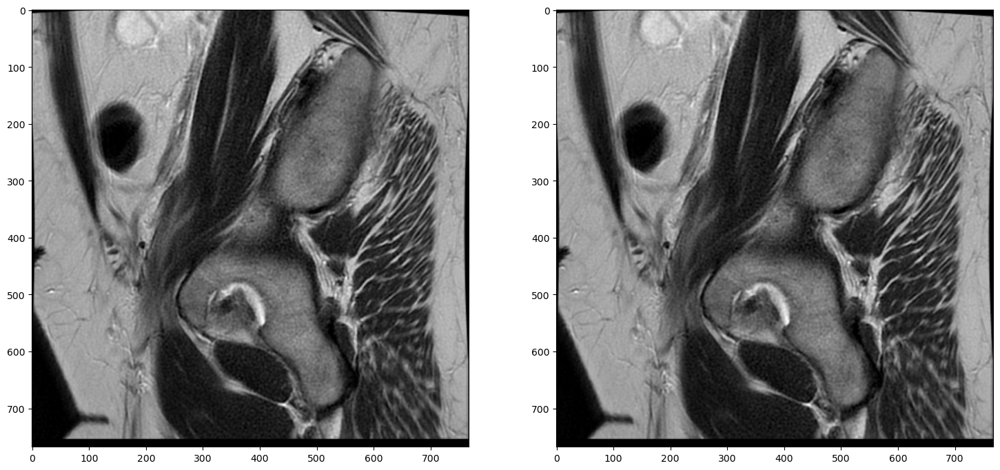

total\0015942_A01.jpg


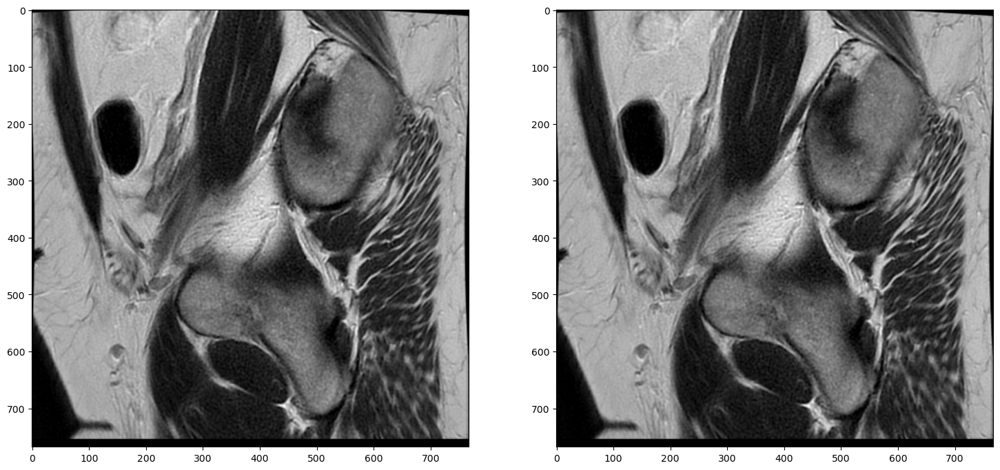

total\0015942_A02.jpg


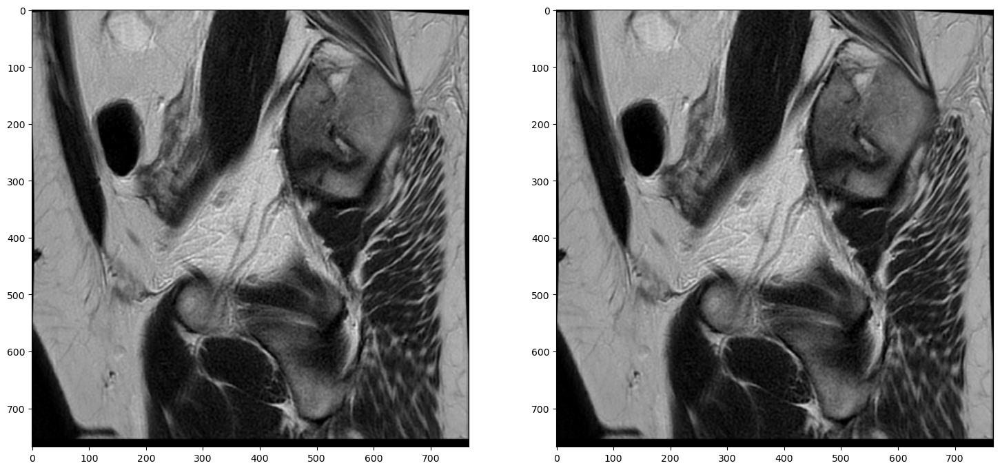

total\0015942_A03.jpg


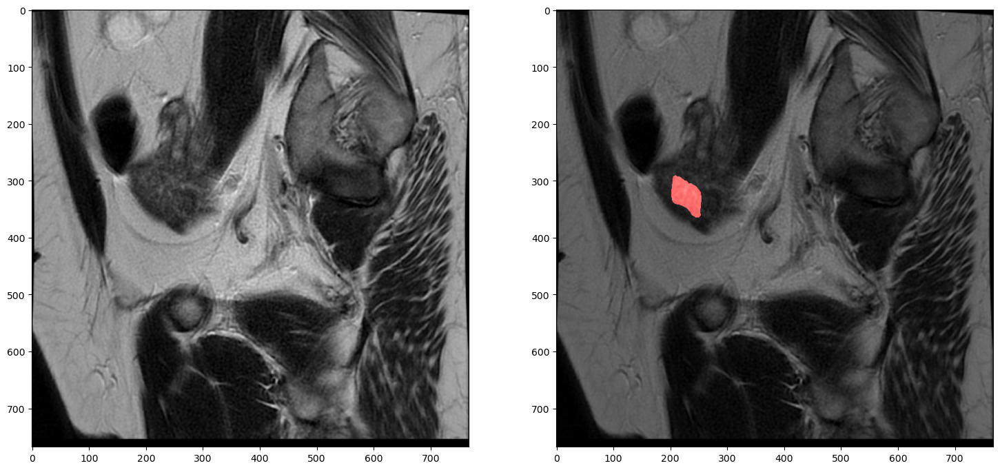

total\0015942_A04.jpg


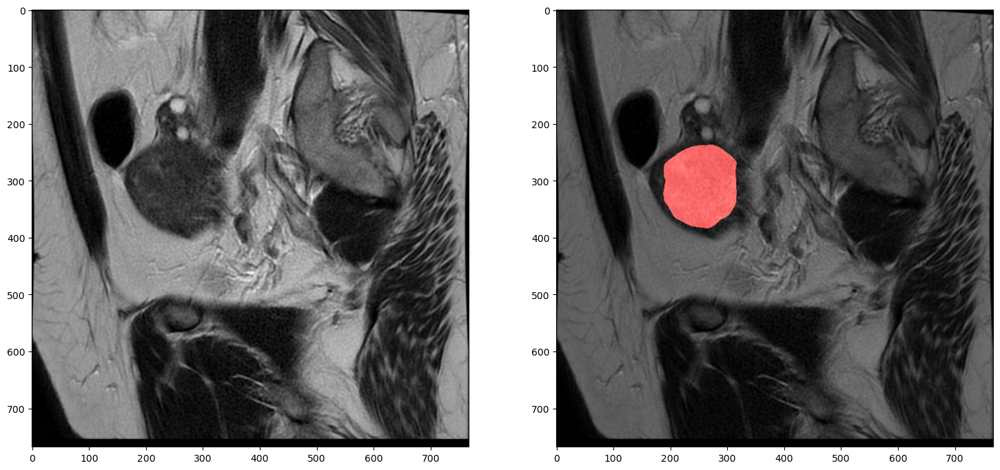

total\0015942_A05.jpg


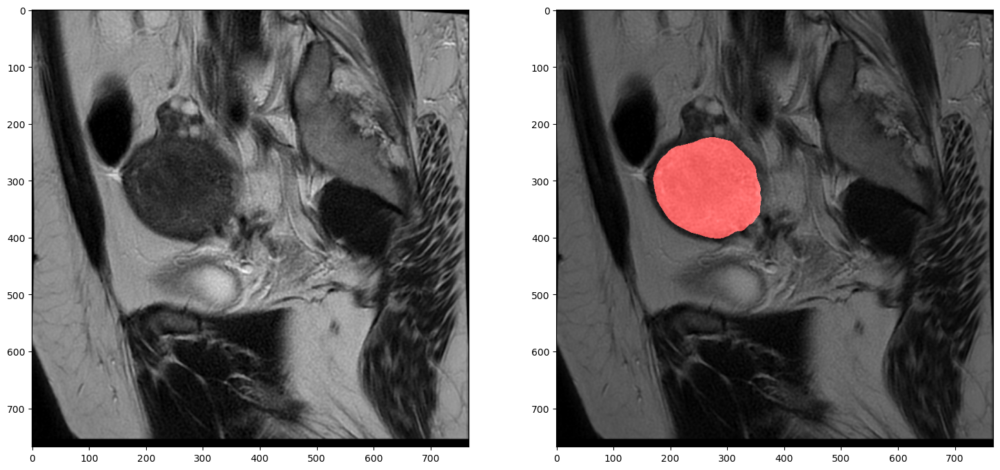

total\0015942_A06.jpg


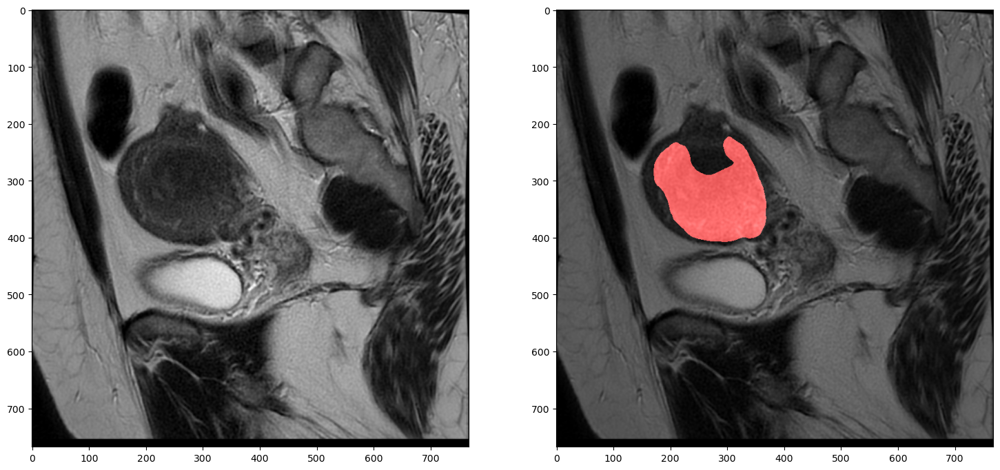

total\0015942_A07.jpg


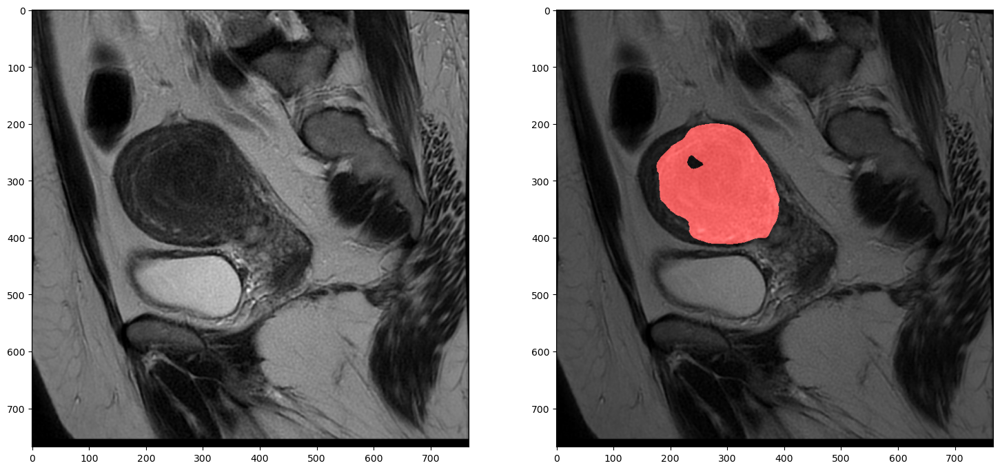

total\0015942_A08.jpg


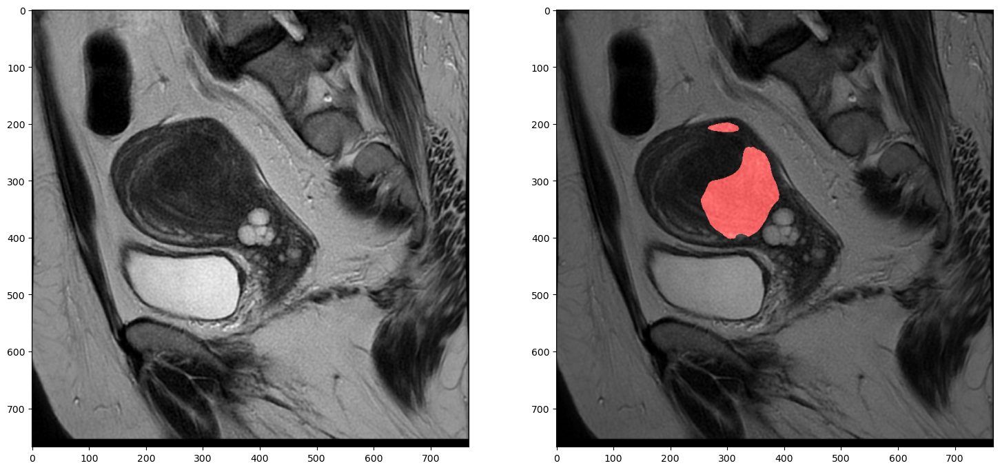

total\0015942_A09.jpg


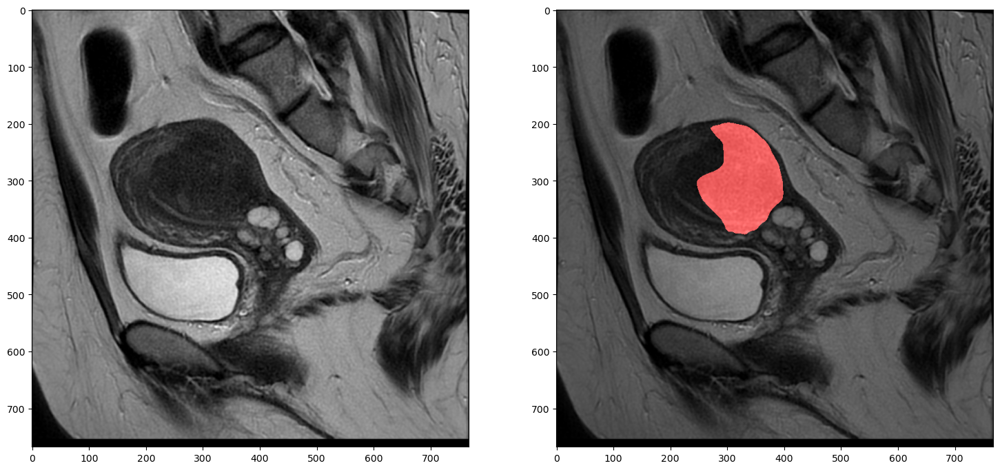

total\0015942_A10.jpg


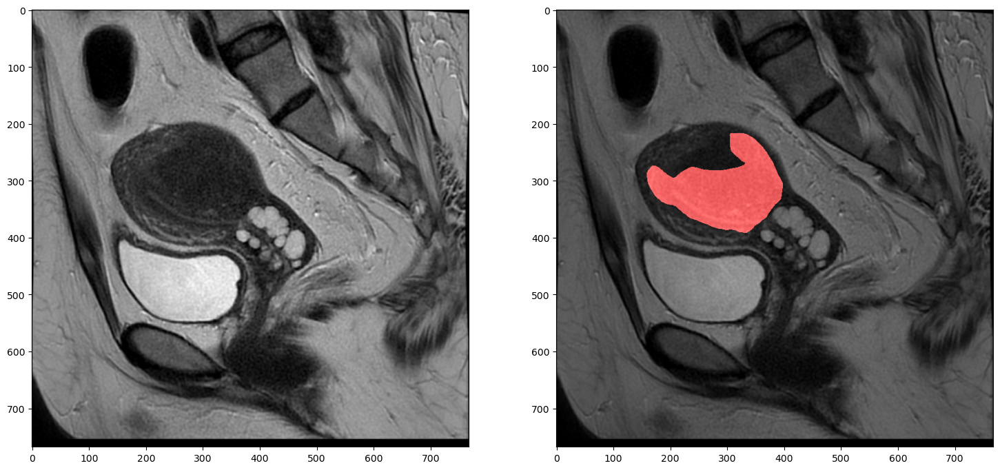

total\0015942_A11.jpg


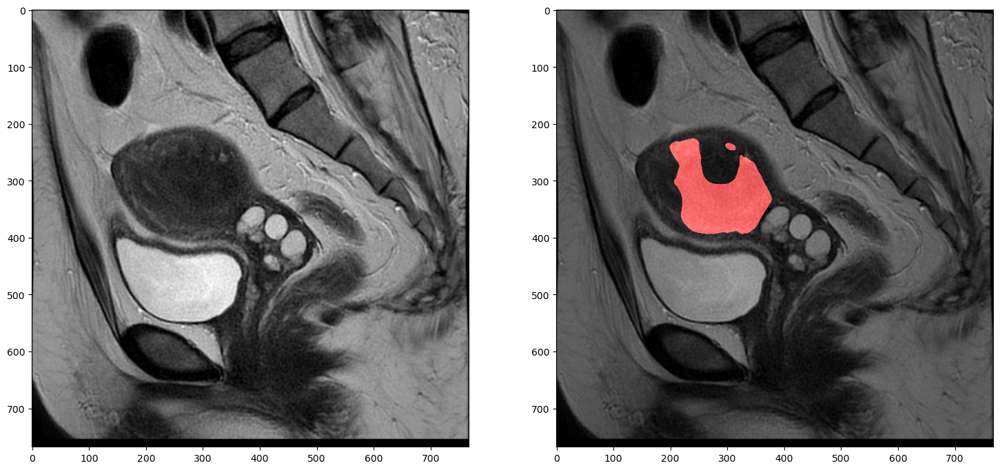

total\0015942_A12.jpg


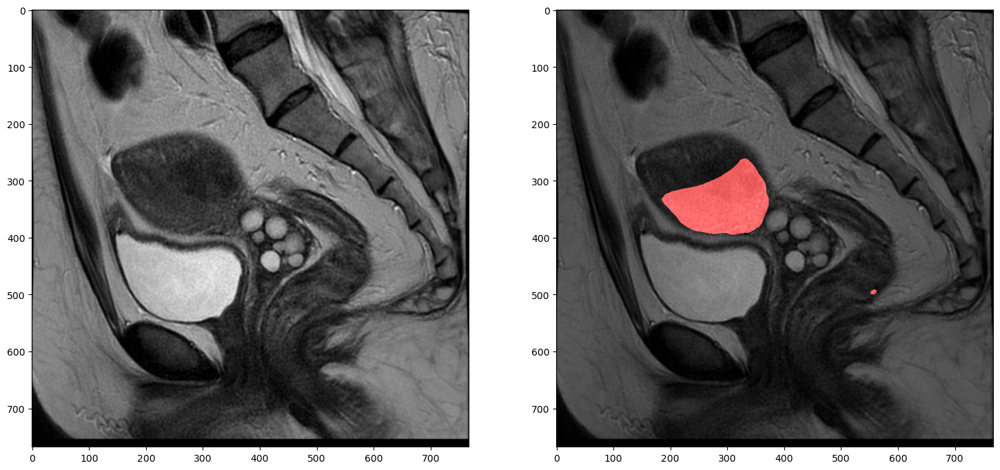

total\0015942_A13.jpg


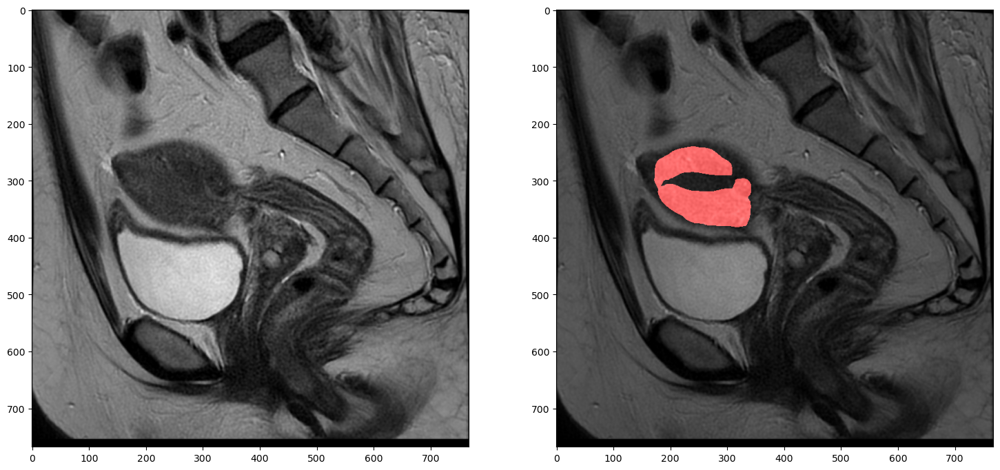

total\0015942_A14.jpg


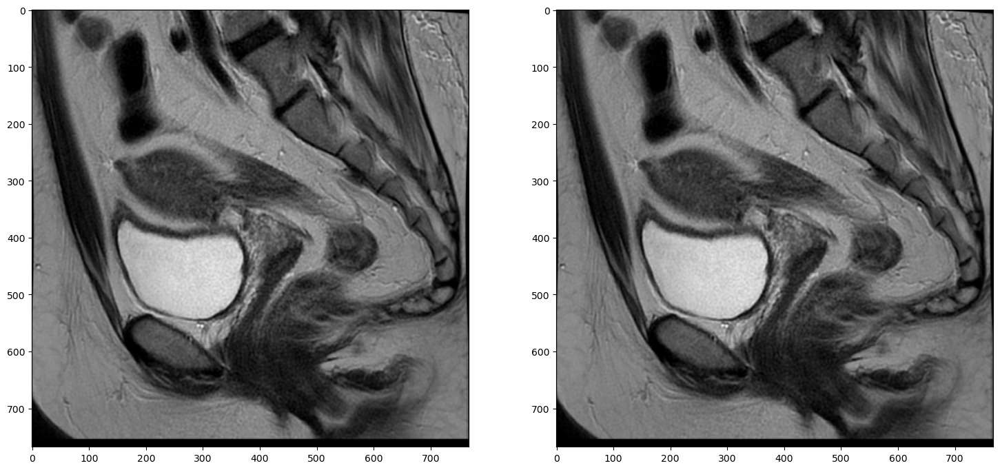

total\0015942_A15.jpg


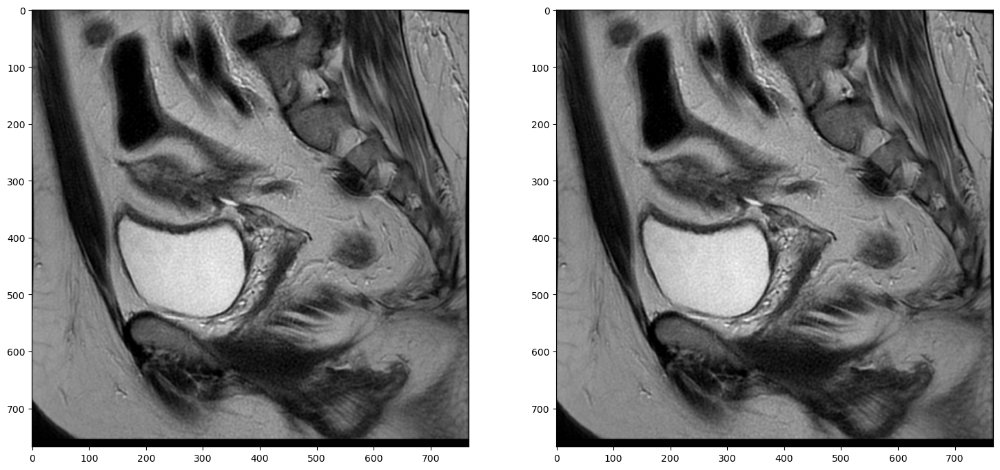

total\0015942_A16.jpg


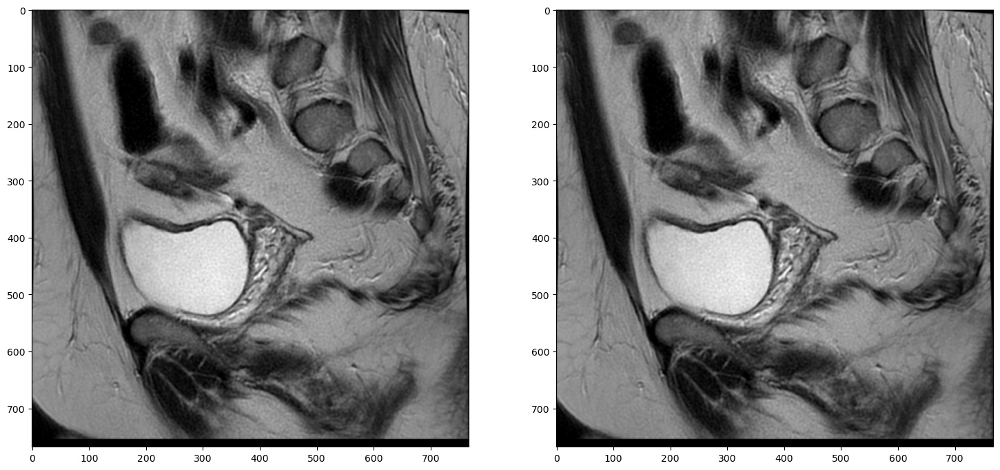

total\0015942_A17.jpg


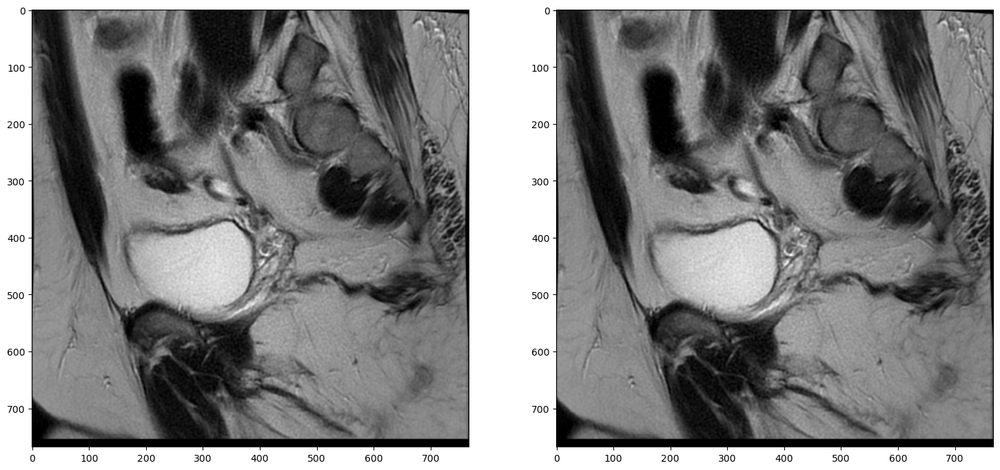

total\0015942_A18.jpg


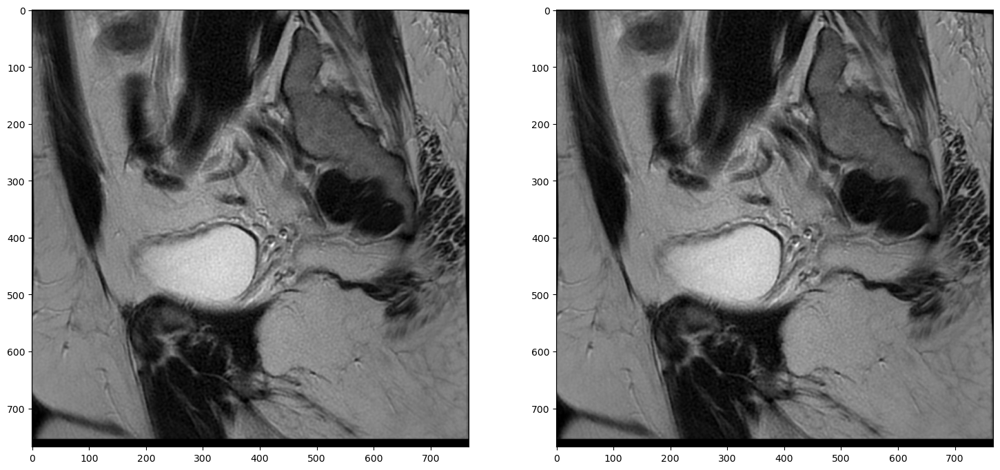

total\0015942_A19.jpg


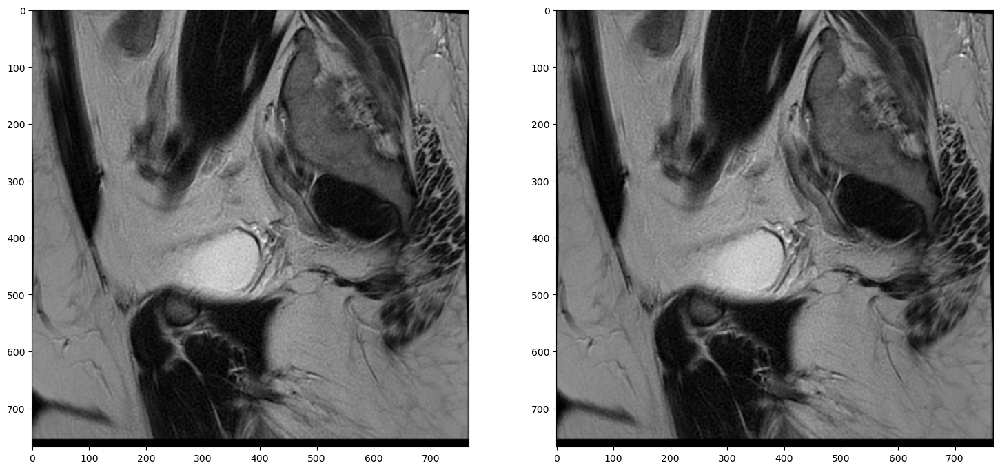

total\0015942_A20.jpg


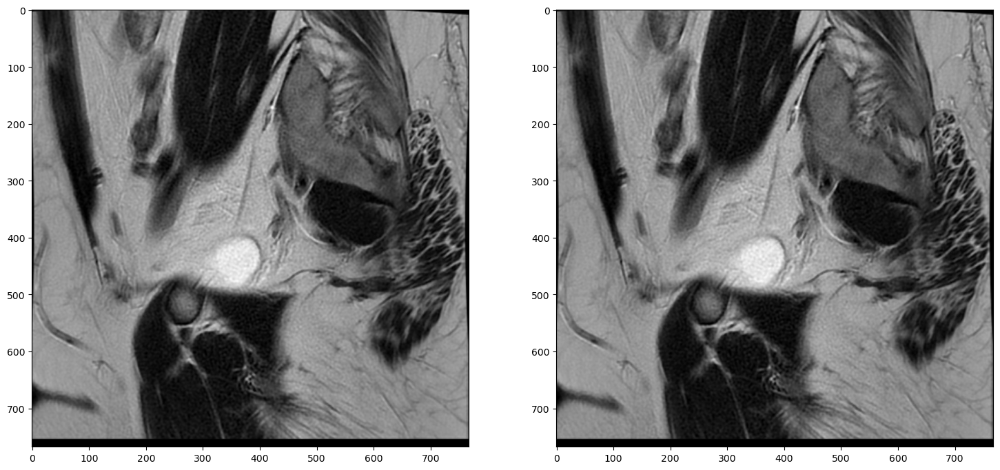

total\0015942_A21.jpg


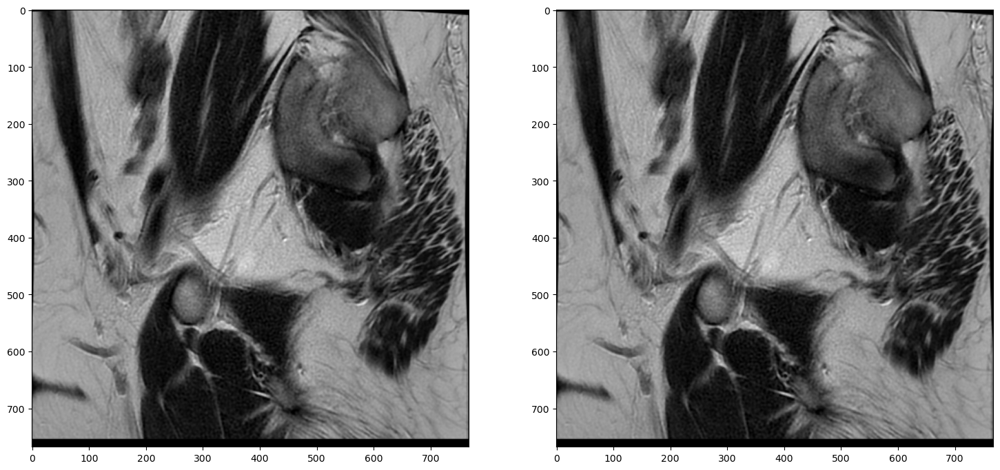

total\0015942_A22.jpg


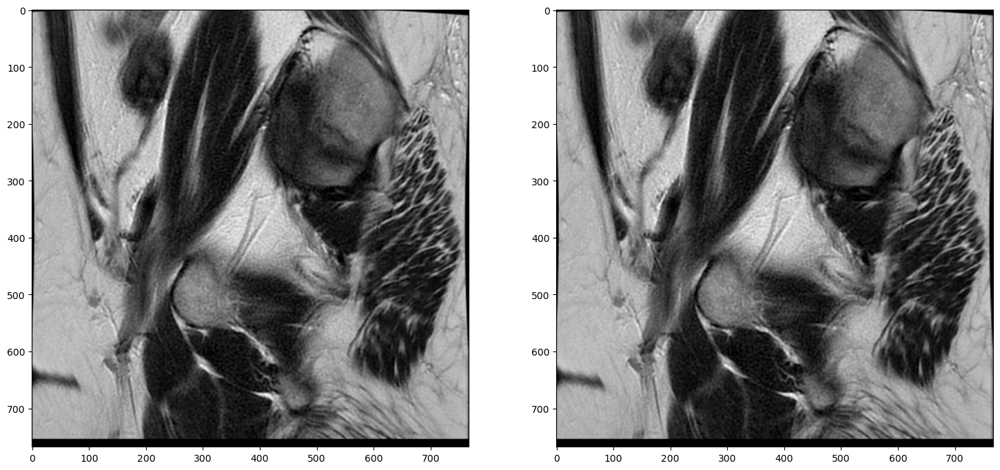

total\0015942_A23.jpg


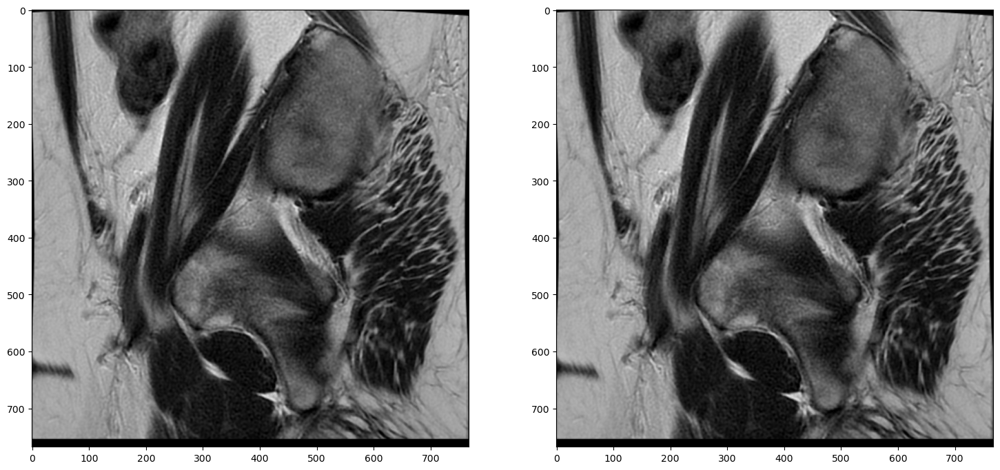

total\0193008_2_A00.jpg


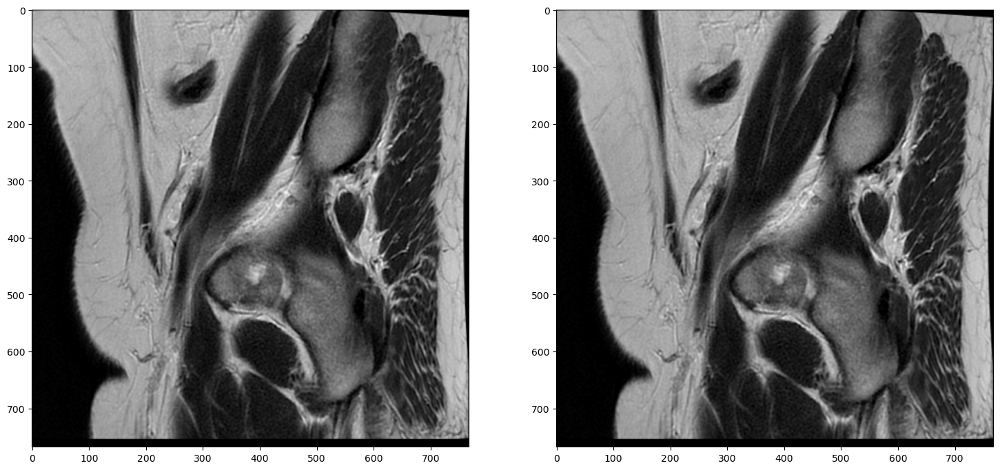

In [35]:
plot_predictions(no_bg_test[:25],no_bg_mask_test[:25], model=model)